Read Raw Data and Process Across Concatenated Samples

In [1]:
import scanpy as sc
import scanpy.external as sce
import numpy as np
import random
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.set_figure_params(dpi=100)
np.random.seed(66)

data_path = "E:/Marmoset_V1/Adult/"

sample_IDs = ["sa22202_1", "sa22202_2", "sa22202_4", "sa22202_5"] # , "sa22202_3", "sa22202_6"

accum_adata, cell_count = [], 0
for sample in sample_IDs:
    raw_path = data_path + sample + "/filtered_feature_bc_matrix/"
    temp_adata = sc.read_10x_mtx(
        raw_path,
                              )
    temp_adata.var_names_make_unique()
    accum_adata.append(temp_adata)
    cell_count += temp_adata.n_obs

adata = accum_adata[0].concatenate(*accum_adata[1:], batch_categories=sample_IDs)
adata

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.


c:\Users\TLab\anaconda3\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(


AnnData object with n_obs × n_vars = 109995 × 21965
    obs: 'batch'
    var: 'gene_ids', 'feature_types'

In [2]:
adata.obs["species"] = ["marmoset_adult"] * adata.shape[0]

In [3]:
sc.pp.filter_cells(adata, min_genes=700)
sc.pp.filter_genes(adata, min_cells=8)

filtered out 12938 cells that have less than 700 genes expressed
filtered out 2355 genes that are detected in less than 8 cells


In [4]:
mito_genes = adata.var_names.str.startswith('mt-')
adata.obs['percent_mito'] = 100 * (np.sum(adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1))
adata.obs["n_UMIs"] = np.sum(adata.X, axis=1)

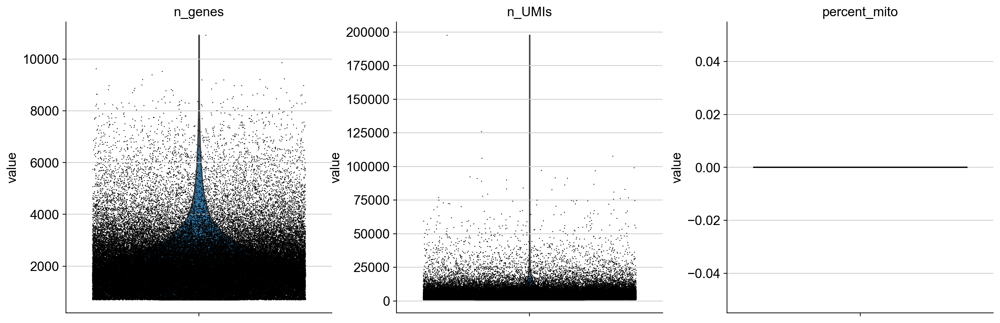

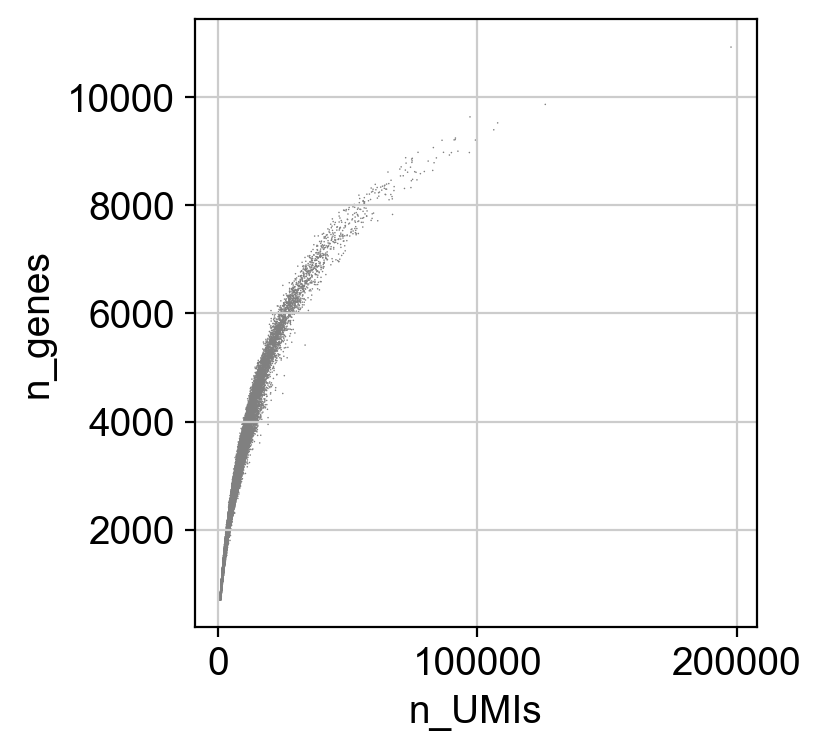

In [5]:
sc.pl.violin(adata, ["n_genes", "n_UMIs", "percent_mito"], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x="n_UMIs", y="n_genes")

In [6]:
adata = adata[adata.obs.percent_mito < 1, :]
adata = adata[adata.obs["n_genes"] < 6500, :]
adata = adata[adata.obs["n_UMIs"] < 40000, :]

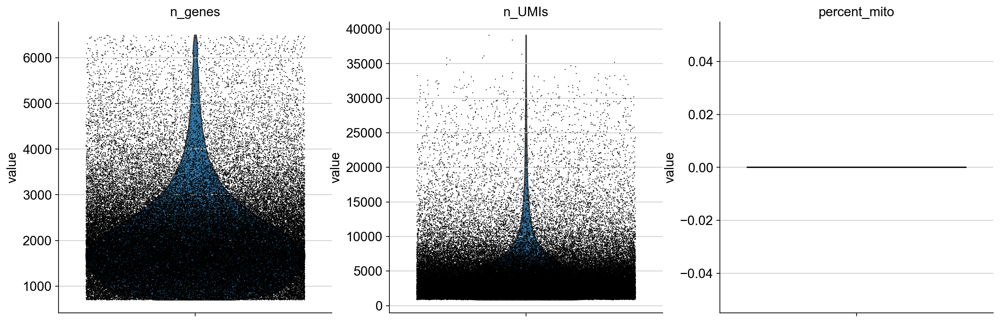

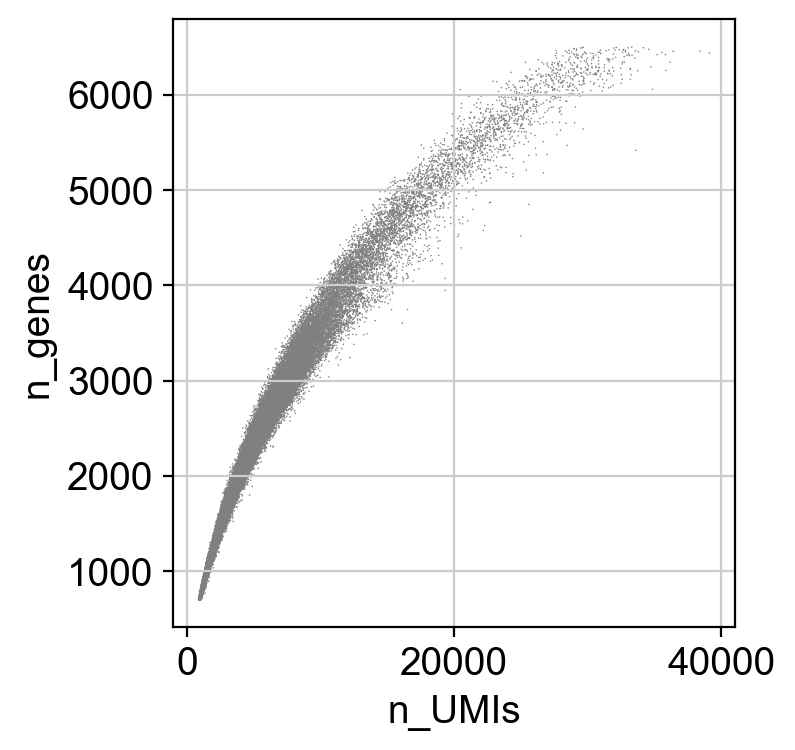

In [7]:
sc.pl.violin(adata, ["n_genes", "n_UMIs", "percent_mito"], jitter=0.4, multi_panel=True)
sc.pl.scatter(adata, x="n_UMIs", y="n_genes")

In [8]:
accum_adata, cell_count = [], 0
for sample in sample_IDs:
    pre_path = data_path + sample + "/" + sample + ".h5ad"
    temp_adata = sc.read_h5ad(
        pre_path,
                              )
    temp_adata.var_names_make_unique()
    accum_adata.append(temp_adata)
    cell_count += temp_adata.n_obs

pre_adata = accum_adata[0].concatenate(*accum_adata[1:], batch_categories=sample_IDs)

adata.obs["doublet"] = pre_adata.obs["doublet"]
adata.obs["doublet_score"] = pre_adata.obs["doublet_score"]

c:\Users\TLab\anaconda3\envs\scanpy\lib\site-packages\anndata\_core\anndata.py:1755: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  warnings.warn(
C:\Users\TLab\AppData\Local\Temp\ipykernel_17388\1999050684.py:13: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["doublet"] = pre_adata.obs["doublet"]


In [9]:
adata.obs

,batch,species,n_genes,percent_mito,n_UMIs,doublet,doublet_score
AAACCCAAGATGGCAC-1-sa22202_1,sa22202_1,marmoset_adult,912,0.0,1308.0,False,0.007493
AAACCCAAGATTGATG-1-sa22202_1,sa22202_1,marmoset_adult,1718,0.0,3042.0,False,0.051632
AAACCCAAGCACTTTG-1-sa22202_1,sa22202_1,marmoset_adult,2594,0.0,5698.0,False,0.241061
AAACCCAAGCCAGACA-1-sa22202_1,sa22202_1,marmoset_adult,2224,0.0,4654.0,False,0.029902
AAACCCAAGCCATGCC-1-sa22202_1,sa22202_1,marmoset_adult,923,0.0,1276.0,False,0.170037
...,...,...,...,...,...,...,...
TTTGTTGGTTGTTGAC-1-sa22202_5,sa22202_5,marmoset_adult,2663,0.0,6753.0,False,0.019531
TTTGTTGTCATCTGTT-1-sa22202_5,sa22202_5,marmoset_adult,4781,0.0,18198.0,False,0.119707
TTTGTTGTCCGTATGA-1-sa22202_5,sa22202_5,marmoset_adult,1158,0.0,1845.0,False,0.008243
TTTGTTGTCGTAGGGA-1-sa22202_5,sa22202_5,marmoset_adult,1798,0.0,3032.0,False,0.104434


In [10]:
adata_raw = adata.copy()
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)
adata.raw = adata
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pp.scale(adata, max_value=10)

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:14)


2023-06-13 13:42:59,100 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-06-13 13:43:24,643 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-06-13 13:43:25,326 - harmonypy - INFO - Iteration 1 of 20
2023-06-13 13:44:20,182 - harmonypy - INFO - Iteration 2 of 20
2023-06-13 13:45:16,419 - harmonypy - INFO - Iteration 3 of 20
2023-06-13 13:46:11,697 - harmonypy - INFO - Iteration 4 of 20
2023-06-13 13:46:56,128 - harmonypy - INFO - Iteration 5 of 20
2023-06-13 13:47:16,040 - harmonypy - INFO - Converged after 5 iterations


computing neighbors


c:\Users\TLab\anaconda3\envs\scanpy\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:56)
running Leiden clustering
    finished: found 32 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:37)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:32)


C:\Ryan\GitHub\scanpy\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


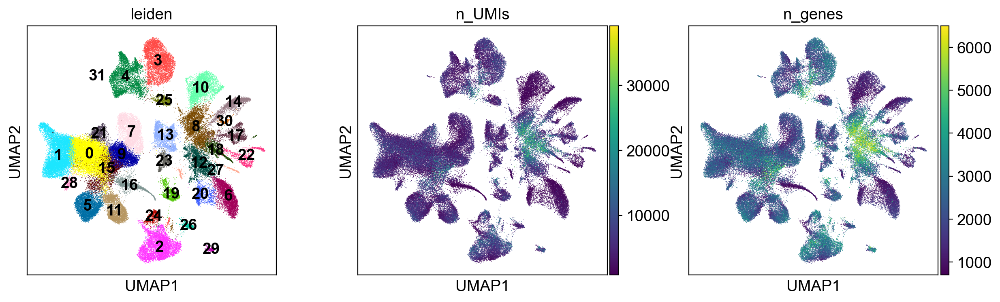

In [11]:
sc.tl.pca(adata, svd_solver="arpack")
sce.pp.harmony_integrate(adata, "batch", theta=2, max_iter_harmony=20)
sc.pp.neighbors(adata, n_neighbors=25, use_rep='X_pca_harmony')
sc.tl.leiden(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color=["leiden", "n_UMIs", "n_genes"], legend_loc="on data")

Check that Samples are Well-Mixed among Clusters

C:\Ryan\GitHub\scanpy\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


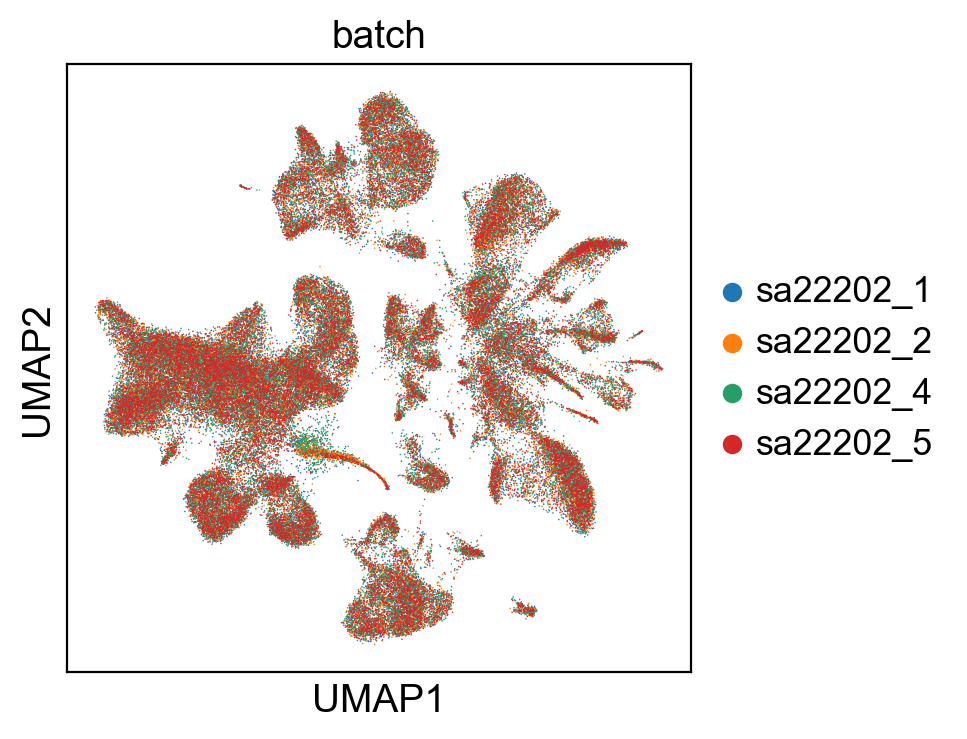

In [12]:
sc.pl.umap(adata, color=["batch"])

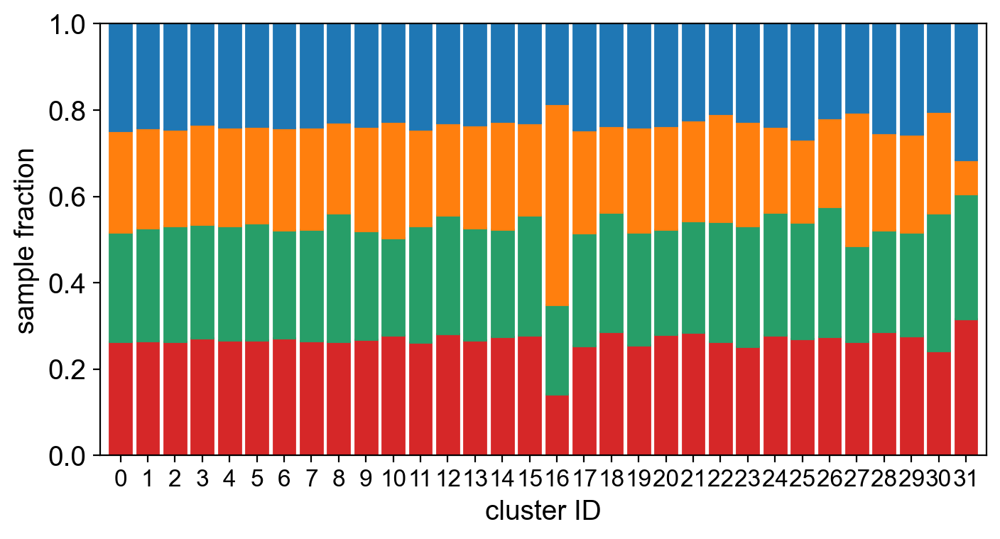

In [13]:
cluster_ids = sorted(np.unique(adata.obs["leiden"]).astype(int))
sample_fractions = []
for sample in sample_IDs[::-1]:
    sf = []
    for cluster in cluster_ids:
        adata_clust = adata[adata.obs["leiden"] == str(cluster), :]
        sf.append(np.sum(adata_clust.obs["batch"] == sample) / adata_clust.shape[0])
    sample_fractions.append(sf)

fig, ax = plt.subplots()
bottom = np.zeros(len(cluster_ids))
for sf, col in zip(sample_fractions, adata.uns["batch_colors"][::-1]):
    ax.bar(cluster_ids, sf, color=col, edgecolor=col, bottom=bottom)
    bottom += np.array(sf)
# ax.hlines(0.5, -1, np.max(cluster_ids) + 1, color="k", linestyle="--", linewidth=1)
ax.set_xlabel("cluster ID")
ax.set_xlim((-0.75, np.max(cluster_ids) + 0.75))
ax.set_xticks(cluster_ids)
ax.set_xticklabels(cluster_ids, fontsize=12)
ax.set_ylabel("sample fraction")
ax.set_ylim((0, 1))
ax.grid(False)
fig.set_size_inches(8, 4)
plt.show(block=False)

Read Doublet-Scored Data and Examine Clusters for Artifacts

C:\Ryan\GitHub\scanpy\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


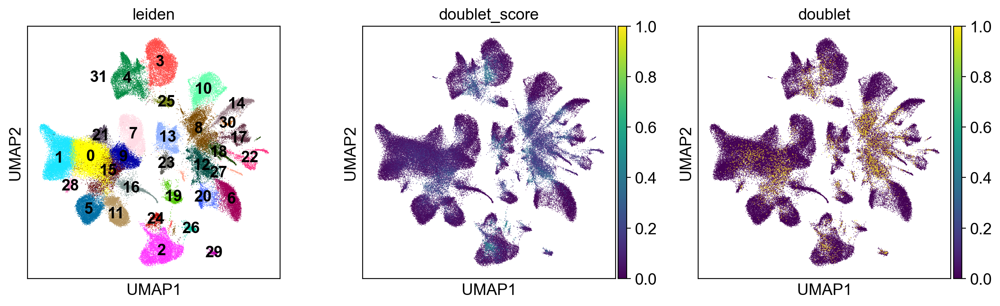

In [15]:
adata.obs["doublet"] = adata.obs["doublet"] - 0 # Convert boolean to integer for plotting
sc.pl.umap(adata, color=["leiden", "doublet_score", "doublet"], legend_loc="on data", vmin=0, vmax=1)

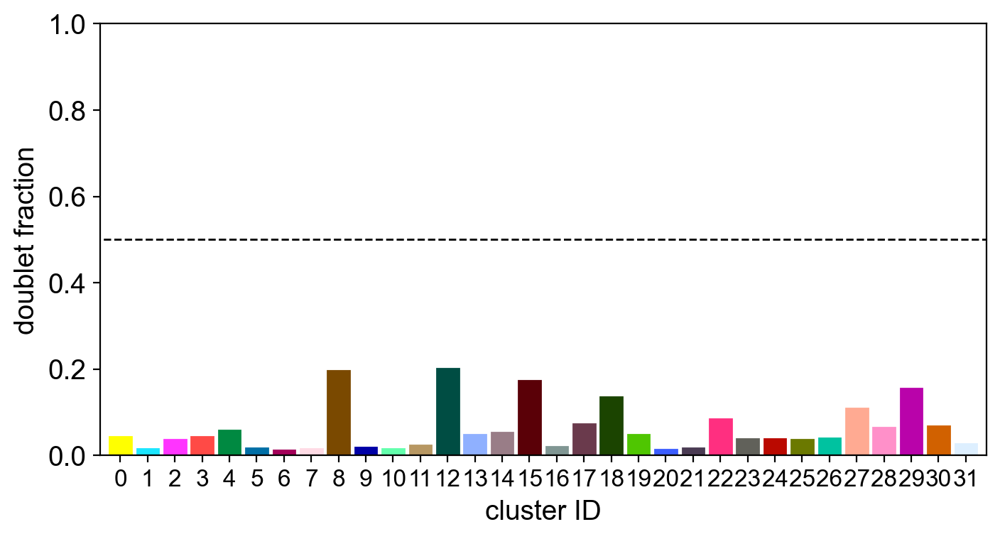

In [16]:
doublet_fraction = []
for cluster in cluster_ids:
    adata_clust = adata[adata.obs["leiden"] == str(cluster), :]
    doublet_fraction.append(np.sum(adata_clust.obs["doublet"]) / adata_clust.shape[0])

fig, ax = plt.subplots()
ax.bar(cluster_ids, doublet_fraction, color=adata.uns["leiden_colors"], edgecolor=adata.uns["leiden_colors"])
ax.hlines(0.5, -1, np.max(cluster_ids) + 1, color="k", linestyle="--", linewidth=1)
ax.set_xlabel("cluster ID")
ax.set_xlim((-0.75, np.max(cluster_ids) + 0.75))
ax.set_xticks(cluster_ids)
ax.set_xticklabels(cluster_ids, fontsize=12)
ax.set_ylabel("doublet fraction")
ax.set_ylim((0, 1))
ax.grid(False)
fig.set_size_inches(8, 4)
plt.show(block=False)

Look for Marker Genes and Identify Ambiguous Clusters

C:\Ryan\GitHub\scanpy\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


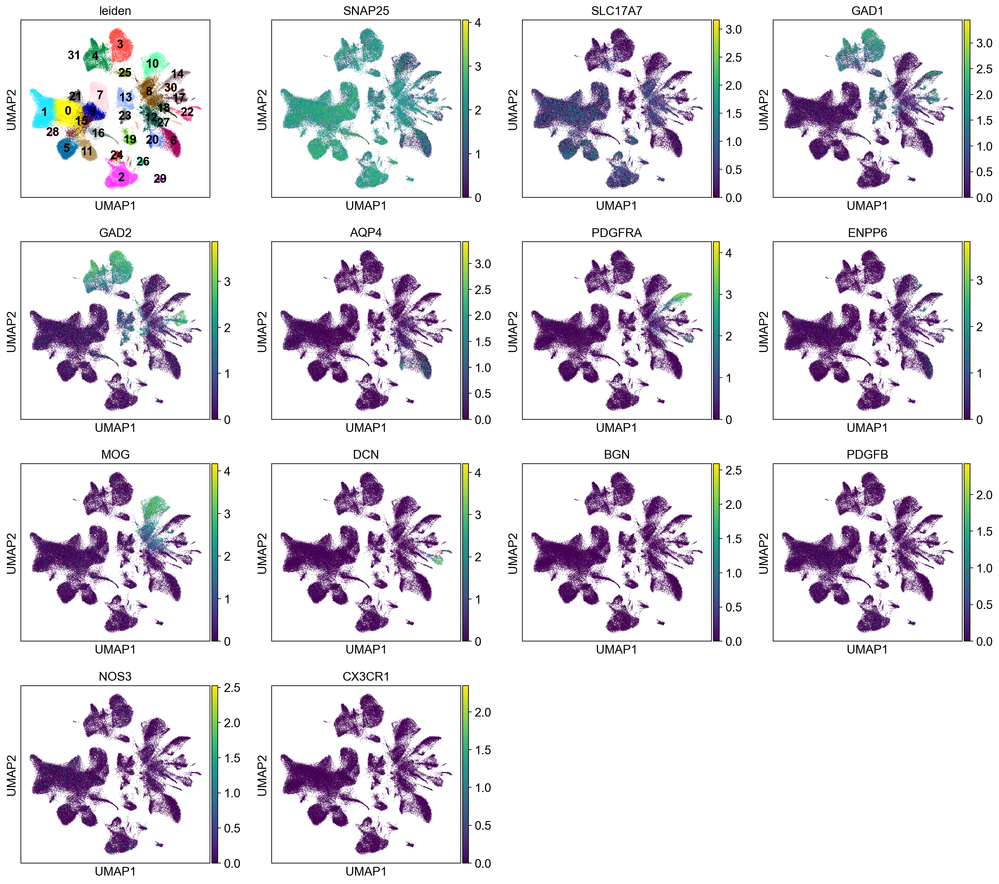

In [17]:
class_markers = [
                 "SNAP25", "SLC17A7", # glutamatergic neurons
                 "GAD1", "GAD2", # GABAergic neurons
                 "AQP4", # astrocytes
                 "PDGFRA", # OPCs
                 "ENPP6", "MOG", # oligodendrocytes
                 "DCN", "BGN", # vascular & leptomeningeal cells
                 "PDGFB", "NOS3", # endothelial cells
                 "CX3CR1", # microglia
                ]

sc.pl.umap(adata, color=["leiden"] + class_markers, legend_loc="on data")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


C:\Ryan\GitHub\scanpy\scanpy\plotting\_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


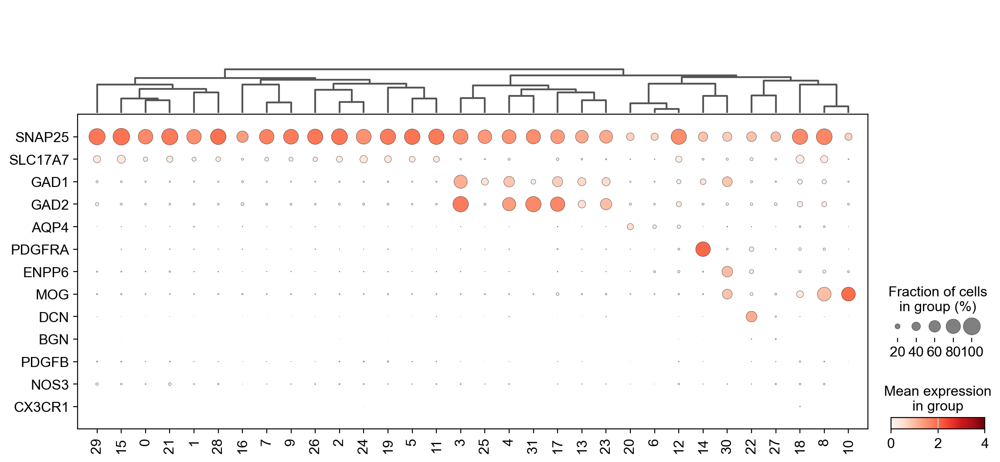

In [18]:
sc.pl.dotplot(adata, class_markers, groupby="leiden", swap_axes=True, dendrogram=True, vmin=0, vmax=4)

In [19]:
class_idx = {
        "glutamatergic" : ["0", "1", "2", "5", "7", "9", "11", "16", "19", "21", "24", "26", "28", "29"], 
        "GABAergic" : ["3", "25", "4", "31", "17", "13", "23"], 
        "non-neuronal" : ["14", "30", "22", "27", "18", "8", "10"], 
        "ambiguous" : ["20", "6", "15", "12"], 
            }

adata.obs["class"] = [None] * adata.shape[0]

for name, idx in class_idx.items():
    mask = np.isin(adata.obs["leiden"], idx)
    adata.obs.loc[mask, "class"] = [name] * np.sum(mask)

In [22]:
adata

AnnData object with n_obs × n_vars = 6099 × 21077
    obs: 'batch', 'doublet', 'doublet_score', 'UPB1', 'UPB2', 'UPB4', 'UPB6', 'LM', 'RL', 'UPBs', 'VISs', 'n_genes', 'percent_mito', 'n_UMIs', 'n_counts', 'leiden', 'class'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_colors', 'batch_colors', 'dendrogram_leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

C:\Ryan\GitHub\scanpy\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


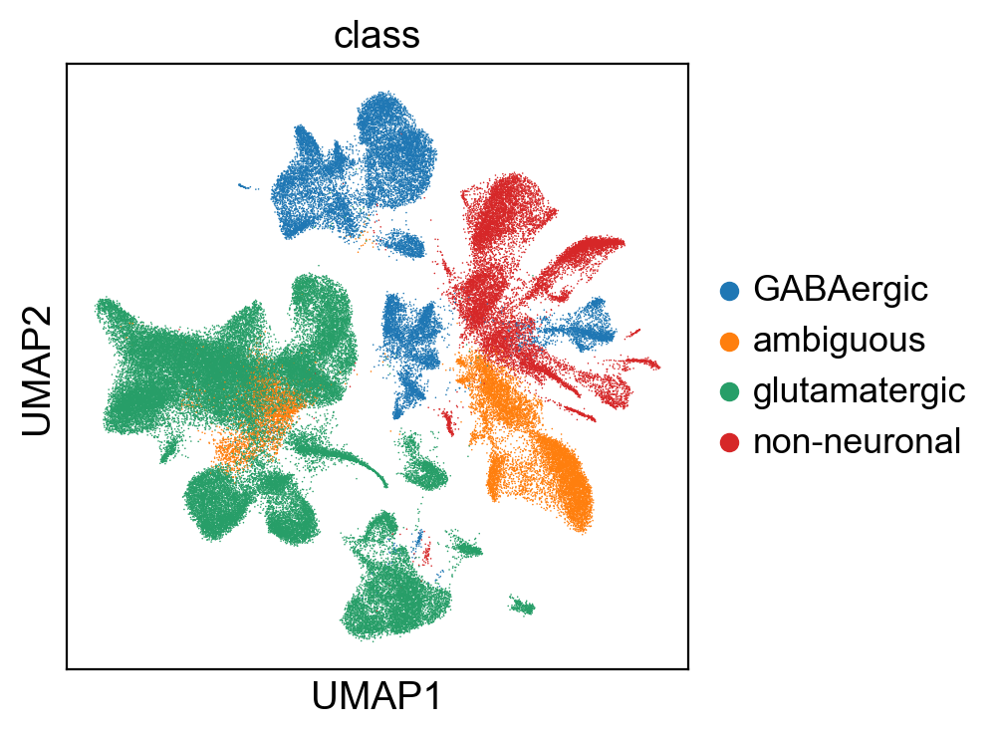

In [20]:
sc.pl.umap(adata, color=["class"])

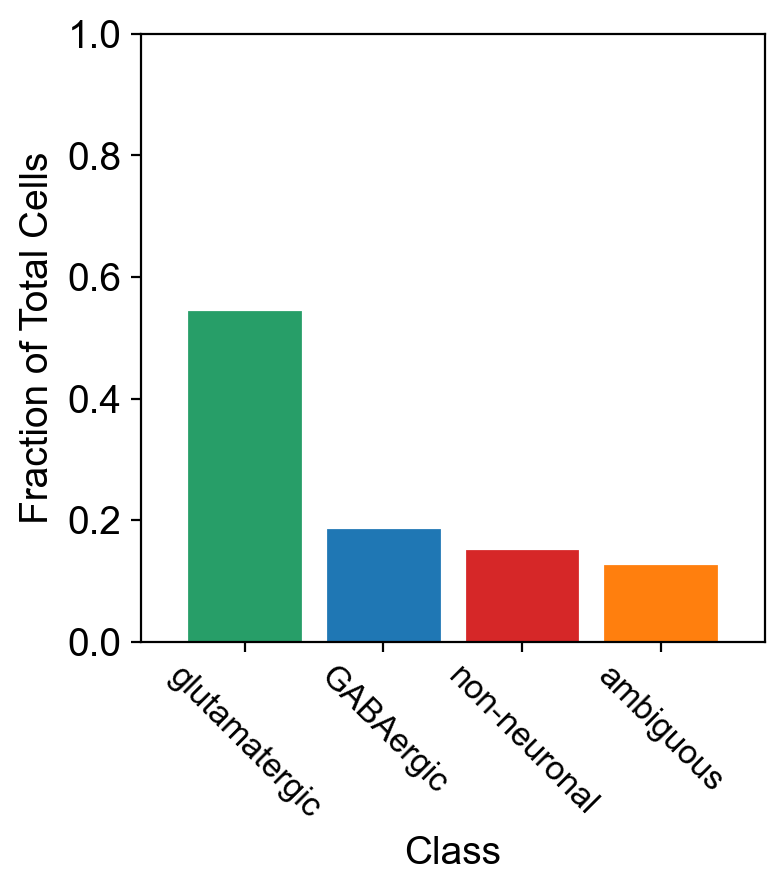

In [21]:
class_ids = ["glutamatergic", "GABAergic", "non-neuronal", "ambiguous"]
class_fractions = []
for clss in class_ids:
    class_fractions.append(np.sum(adata.obs["class"] == clss) / adata.shape[0])

fig, ax = plt.subplots()
col = [adata.uns["class_colors"][idx] for idx in [2, 0, 3, 1]]
ax.bar(class_ids, class_fractions, color=col, edgecolor=col)
ax.set_xlabel("Class")
ax.set_xlim((-0.75, len(class_ids) - 0.25))
ax.set_xticks(class_ids)
ax.set_xticklabels(class_ids, fontsize=12, rotation=-45)
ax.set_ylabel("Fraction of Total Cells")
ax.set_ylim((0, 1))
ax.grid(False)
fig.set_size_inches(4, 4)
plt.show(block=False)

In [22]:
adata.obs["doublet"] = adata.obs["doublet"].astype(str)
adata.obs

,batch,species,n_genes,percent_mito,n_UMIs,doublet,doublet_score,n_counts,leiden,class
AAACCCAAGATGGCAC-1-sa22202_1,sa22202_1,marmoset_adult,912,0.0,1308.0,0,0.007493,1308.0,14,non-neuronal
AAACCCAAGATTGATG-1-sa22202_1,sa22202_1,marmoset_adult,1718,0.0,3042.0,0,0.051632,3042.0,3,GABAergic
AAACCCAAGCACTTTG-1-sa22202_1,sa22202_1,marmoset_adult,2594,0.0,5698.0,0,0.241061,5698.0,15,ambiguous
AAACCCAAGCCAGACA-1-sa22202_1,sa22202_1,marmoset_adult,2224,0.0,4654.0,0,0.029902,4654.0,11,glutamatergic
AAACCCAAGCCATGCC-1-sa22202_1,sa22202_1,marmoset_adult,923,0.0,1276.0,0,0.170037,1276.0,0,glutamatergic
...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTTGTTGAC-1-sa22202_5,sa22202_5,marmoset_adult,2663,0.0,6753.0,0,0.019531,6753.0,3,GABAergic
TTTGTTGTCATCTGTT-1-sa22202_5,sa22202_5,marmoset_adult,4781,0.0,18198.0,0,0.119707,18198.0,12,ambiguous
TTTGTTGTCCGTATGA-1-sa22202_5,sa22202_5,marmoset_adult,1158,0.0,1845.0,0,0.008243,1845.0,6,ambiguous
TTTGTTGTCGTAGGGA-1-sa22202_5,sa22202_5,marmoset_adult,1798,0.0,3032.0,0,0.104434,3032.0,11,glutamatergic


Save Classes Separately

In [24]:
save_path = "E:/Marmoset_V1/Adult/"

adata_raw.obs = adata.obs
adata_raw.write_h5ad(save_path + "Marmoset_V1_Adult_All.h5ad")

adata.write_h5ad(save_path + "Marmoset_V1_Adult_All_Clustered.h5ad")

for classname, filename in zip(["glutamatergic", "GABAergic", "non-neuronal"], ["Glut", "GABA", "Non"]):
    
    adata_class = adata_raw[adata_raw.obs["class"] == classname, :]
    del adata_class.uns
    del adata_class.obsm
    del adata_class.varm
    del adata_class.obsp
    adata_class.var = adata_class.var[["gene_ids", "feature_types"]]

    adata_class.write_h5ad(save_path + "Marmoset_V1_Adult_" + filename + ".h5ad")